In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import multivariate_normal
import torch
import torch.nn as nn
from torch.utils import data
torch.set_printoptions(precision=9)
torch.manual_seed(42)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cpu')

In [2]:
# mu_prior = 1*np.array([-1,1])
mu_prior = np.zeros(2)
C_prior = np.eye(2)/10
rv_prior = multivariate_normal(mu_prior, C_prior)

mu_data = 2*np.ones(2)
C_data = np.eye(2)/10
rv_data = multivariate_normal(mu_data, C_data)

# X_data = np.concatenate([rv_data.rvs(3000), np.array([0,4])-rv_data.rvs(3000), -np.array([0,4])+rv_data.rvs(3000), -rv_data.rvs(3000)])
X_data = np.concatenate([rv_prior.rvs(5000)+np.array([-1,-1]), 0.5*rv_prior.rvs(5000)+np.array([3,3])])
X_prior = rv_prior.rvs(10000)

In [6]:
n, m = 10000, 10000
gauss = lambda q,a,c: a*np.random.randn(2, q) + np.array(c)[:,None]
X_prior = gauss(n, 0.2, [0,1]).T
banana = lambda x1,x2 : np.array([x1, x2 + 0.03 * x1**2 - 100 * 0.03])
xprior, yprior = np.array([[10, 0],[0,1]]) @ np.random.randn(2,int(m/2))
X_data = np.concatenate([banana(xprior, yprior)/10, gauss(int(m/4),.2,[-1,2.5]), gauss(int(m/4),.2,[1,2.5])], axis=1).T

In [4]:
n, m = 10000, 10000
gauss = lambda q,a,c: a*np.random.randn(2, q) + np.array(c)[:,None]
banana = lambda x1,x2 : np.array([x1, x2 + 0.03 * x1**2 - 100 * 0.03])
xprior, yprior = np.array([[10, 0],[0,1]]) @ np.random.randn(2,int(n/2))
X_prior = np.concatenate([banana(xprior, yprior)/10, gauss(int(n/4),.2,[-1,2.5]), gauss(int(n/4),.2,[1,2.5])], axis=1).T

xprior, yprior = np.array([[10, 0],[0,1]]) @ np.random.randn(2,int(m/2))
X_data = np.concatenate([banana(xprior, yprior)/10, gauss(int(m/4),.2,[-1,2.5]), gauss(int(m/4),.2,[1,2.5])], axis=1) 

# A_star = np.random.randn(2,2)
# h_star = np.random.randn(2)
A_star = np.array([[-2.5, 0.6],[1, -1]])
h_star = np.array([-0.4, -2])
X_data = (A_star @ X_data + h_star[:,None]).T

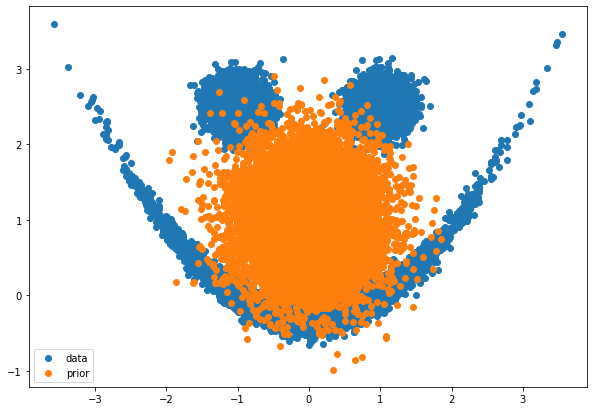

In [7]:
plt.figure(figsize=(10,7))
plt.scatter(X_data[:,0], X_data[:,1], label="data")
plt.scatter(X_prior[:,0], X_prior[:,1], label="prior")
plt.legend(), plt.show();

In [8]:
def PositionalEncoding(n, emb_dim):
    assert n.shape[-1] == 1, "Last dimension must be equal to 1"
    assert emb_dim%2 == 0, "Embedding dimension not divisible by 2"
    half_dim = emb_dim // 2
    emb = np.log(10000.) / (half_dim - 1)
    emb = n * torch.exp(torch.arange(half_dim) * -emb)
    emb = torch.cat([torch.sin(emb), torch.cos(emb)], dim=-1)
    return emb



class MLP(nn.Module):
    def __init__(self, in_dim, h_dim, out_dim):
        super().__init__()
        self.layer1 = nn.Linear(in_dim, h_dim)
        self.layer2 = nn.Linear(h_dim, out_dim)
    
    def forward(self, state0):
        state1 = torch.relu(self.layer1(state0))
        state2 = torch.relu(self.layer2(state1))
        return state2

    

class PeMLP(nn.Module):
    def __init__(self):
        super().__init__()
        self.mlp1a = MLP(2, 16, 32)
        self.mlp1b = MLP(16, 16, 32)
        self.mlp2 = MLP(64, 128, 128)
        self.outlayer = nn.Linear(128, 2)
    
    def forward(self, ns, Xs):
        pos_enc = PositionalEncoding(ns[:,None,None].expand(-1,Xs.shape[-2],1), 16)
        concat = torch.cat([self.mlp1b(pos_enc), self.mlp1a(Xs)], axis=-1)
        Xdrift = self.outlayer(self.mlp2(concat))
        return Xs + Xdrift

    

class ListMLP(nn.Module):
    def __init__(self, nb_timesteps, backward=False):
        super().__init__()
        self.nb_timesteps = nb_timesteps
        self.backward = backward
        self.mlplist = nn.ModuleList([MLP(2,32,32) for i in range(nb_timesteps)])
        self.outlayer = nn.ModuleList([nn.Linear(32,2) for i in range(nb_timesteps)])
    
    def forward(self, ns, Xs):
        Xdrift = torch.zeros(Xs.shape)        
        if self.backward:
            ns = ns - 1
        for i in range(len(ns)):
            Xdrift[i] = self.outlayer[ns[i]](self.mlplist[ns[i]](Xs[i]))         
        return Xs + Xdrift

In [9]:
class DSB(nn.Module):
    def __init__(self, nb_timesteps, gamma):
        super().__init__()
        self.N = nb_timesteps
        self.gamma = torch.tensor(gamma)
        # self.forward_net = ListMLP(nb_timesteps, backward=False)
        # self.backward_net = ListMLP(nb_timesteps, backward=True)
        self.forward_net = PeMLP()
        self.backward_net = PeMLP()
    
    @torch.no_grad()
    def forward_sampling(self, X0, a_init=None):
        Zs = torch.randn(self.N, *X0.shape)
        Xs = torch.empty(self.N+1, *X0.shape)
        Xs[0] = X0  
        
        if a_init is not None: # discretized Ornstein-Uhlenbeck process
            for ns in torch.arange(0, self.N, 1)[:,None]:
                Xs[ns+1] = (1 - a_init * self.gamma) * Xs[ns] + torch.sqrt(2 * self.gamma) * Zs[ns]   
        else:
            for ns in torch.arange(0, self.N, 1)[:,None]:
                Xs[ns+1] = self.forward_net(ns, Xs[ns]) + torch.sqrt(2 * self.gamma) * Zs[ns]
        return Xs
    
    @torch.no_grad()
    def backward_sampling(self, XN):
        Zs = torch.randn(self.N, *XN.shape)
        Xs = torch.empty(self.N+1, *XN.shape)
        Xs[self.N] = XN
        
        for ns in torch.arange(self.N, 0, -1)[:,None]:
            Xs[ns-1] = self.backward_net(ns, Xs[ns]) + torch.sqrt(2 * self.gamma) * Zs[ns-1]
            # Xs[ns-1] = Xs[ns] + self.gamma * (a_init * Xs[ns] + 2*self.backward_net(ns, Xs[ns])) + torch.sqrt(2 * self.gamma) * Zs[ns-1]
        return Xs
    
    def backward_loss(self, Xs, a_init=None):
        ns = torch.arange(0, self.N, 1)
        pred = self.backward_net(ns+1, Xs[ns+1])
        if a_init is not None:  # loss for discretized Ornstein-Uhlenbeck process
            target =  Xs[ns+1] + (1 - a_init * self.gamma) * Xs[ns] - (1 - a_init * self.gamma) * Xs[ns+1]
            # target = -Zs /  torch.sqrt(2 * self.gamma)
        else:
            with torch.no_grad():
                # target = Xs[ns+1] + self.forward_net(ns, Xs[ns]) - self.forward_net(ns, Xs[ns+1])
                target = Xs[ns]
        loss = ((pred - target)**2).sum()
        return loss / Xs.shape[-2]
    
    def forward_loss(self, Xs):
        ns = torch.arange(0, self.N, 1)
        pred = self.forward_net(ns, Xs[ns])
        with torch.no_grad():
            # target = Xs[ns] + self.backward_net(ns+1, Xs[ns+1]) - self.backward_net(ns+1, Xs[ns])
            target = Xs[ns+1]
        loss = ((pred - target)**2).sum()
        return loss / Xs.shape[-2]    

In [19]:
# dynamic params
nb_timesteps = 20
gamma = 0.01
a_init = 1 / np.diag(C_prior).mean()
# model params

# training params
nb_epoch = 2
nb_dsb_iter = 10
batch_size = 1000

# data
f_loader = data.DataLoader(torch.FloatTensor(X_data), batch_size=batch_size, shuffle=True)
b_loader = data.DataLoader(torch.FloatTensor(X_prior), batch_size=batch_size, shuffle=True)

# init
dsb = DSB(nb_timesteps, gamma)
f_optimizer = torch.optim.Adam(dsb.parameters(), lr=0.01) 
b_optimizer = torch.optim.Adam(dsb.parameters(), lr=0.01)

In [20]:
%%time
dsb.train()
f_losses, b_losses = [], []
for dsb_iter in range(1,nb_dsb_iter+1):
    if dsb_iter%1 == 0:
        print(f"DSB iteration {dsb_iter}")
    
    for epoch in range(nb_epoch):
        for X0 in f_loader:
            b_optimizer.zero_grad()

            if dsb_iter == 1:
                Xs = dsb.forward_sampling(X0, a_init=a_init)
                loss =  dsb.backward_loss(Xs, a_init=a_init)
                # Xs, Zs = dsb.forward_sampling(X0, a_init=a_init)
                # loss =  dsb.backward_loss(Xs, Zs, a_init=a_init)
            else:
                Xs = dsb.forward_sampling(X0)
                loss =  dsb.backward_loss(Xs)
            b_losses.append(loss.detach())

            loss.backward()
            b_optimizer.step()
        
    
    for epoch in range(nb_epoch):
        for XN in b_loader:
            f_optimizer.zero_grad()

            Xs = dsb.backward_sampling(XN)
            loss = dsb.forward_loss(Xs)
            f_losses.append(loss.detach())

            loss.backward()
            f_optimizer.step()    

DSB iteration 1
Wall time: 3.66 s


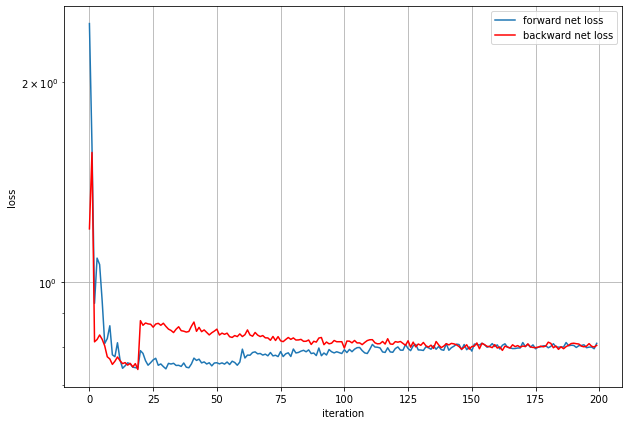

In [12]:
plt.figure(figsize=(10,7))
plt.semilogy(f_losses, label="forward net loss")
plt.semilogy(b_losses, 'r', label="backward net loss")
plt.xlabel("iteration"), plt.ylabel("loss")
plt.legend(), plt.grid(), plt.show();

In [21]:
dsb.eval()
X_sampled = dsb.backward_sampling(torch.FloatTensor(XN)).numpy() # X0
X_sampled.shape

(21, 1000, 2)

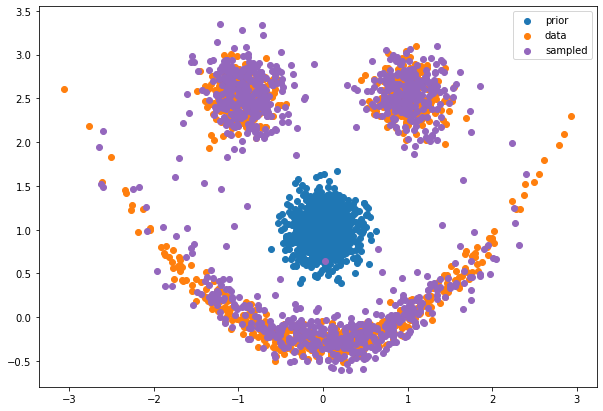

In [50]:
kplotted = 0
plt.figure(figsize=(10,7))
plt.scatter(XN[:,0], XN[:,1], label="prior")
plt.scatter(X0[:,0], X0[:,1], color='C1', label="data")
plt.scatter(X_sampled[kplotted,:,0], X_sampled[kplotted,:,1], color='C4', label="sampled")
plt.legend(), plt.show();

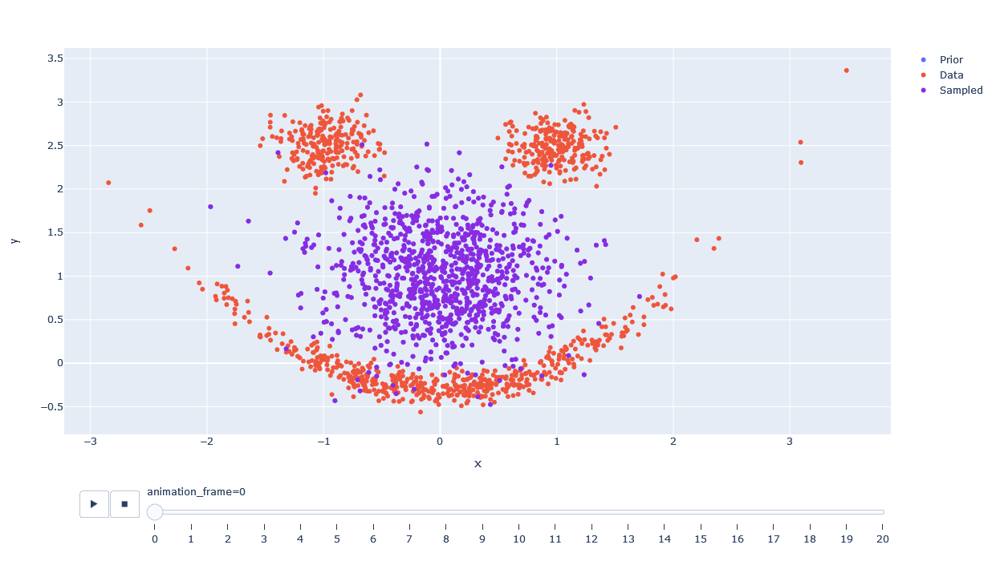

In [18]:
l_prior, l_data, l_sampled, l_time = len(XN), len(X0), X_sampled.shape[1], X_sampled.shape[0]
scatx = np.concatenate([np.concatenate([XN[:,0], X0[:,0], X_sampled[::-1][i,:,0]]) for i in range(l_time)])
scaty = np.concatenate([np.concatenate([XN[:,1], X0[:,1], X_sampled[::-1][i,:,1]]) for i in range(l_time)])
colors = np.tile(l_prior*["Prior"]+l_data*["Data"]+l_sampled*["Sampled"], l_time)
times = np.repeat(range(l_time), l_prior+l_data+l_sampled)

import plotly.express as px         
fig = px.scatter(x=scatx, y=scaty, animation_frame=times, color=colors, 
                 color_discrete_sequence =["#636efa", "#EF553B", "#8A2BE2"], width=700, height=700, labels={"color": ""})
fig.layout.updatemenus[0].buttons[0].args[1]['frame']['duration'] = 100
fig.show()
# fig.write_html("./HTML/DSB12.html")

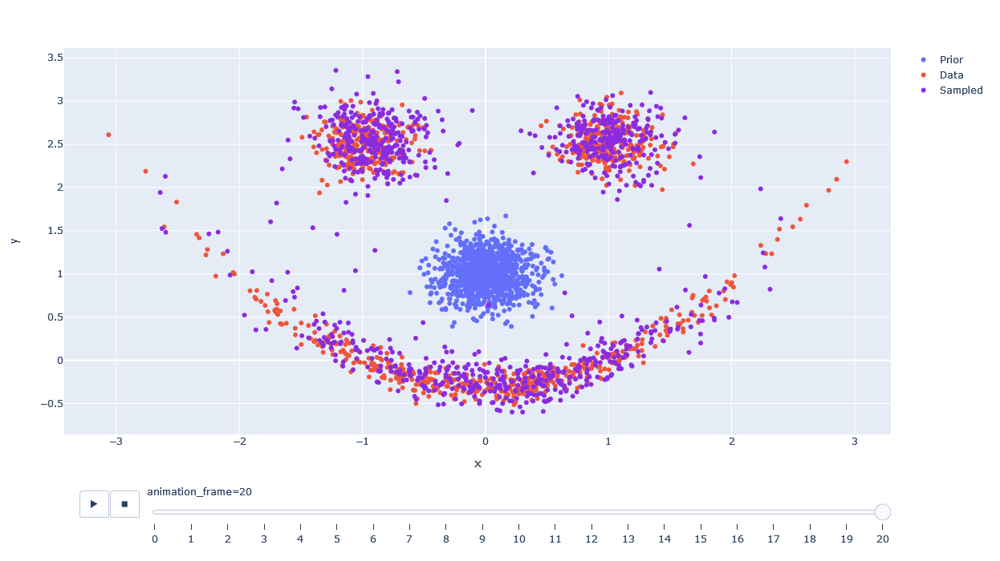

In [51]:
l_prior, l_data, l_sampled, l_time = len(XN), len(X0), X_sampled.shape[1], X_sampled.shape[0]
scatx = np.concatenate([np.concatenate([XN[:,0], X0[:,0], X_sampled[::-1][i,:,0]]) for i in range(l_time)])
scaty = np.concatenate([np.concatenate([XN[:,1], X0[:,1], X_sampled[::-1][i,:,1]]) for i in range(l_time)])
colors = np.tile(l_prior*["Prior"]+l_data*["Data"]+l_sampled*["Sampled"], l_time)
times = np.repeat(range(l_time), l_prior+l_data+l_sampled)

import plotly.express as px         
fig = px.scatter(x=scatx, y=scaty, animation_frame=times, color=colors, 
                 color_discrete_sequence =["#636efa", "#EF553B", "#8A2BE2"], width=700, height=700, labels={"color": ""})
fig.layout.updatemenus[0].buttons[0].args[1]['frame']['duration'] = 100
fig.show()
fig.write_html("./HTML/DSB12.html")